# Studio sulle temperature giornaliere massime degli ultimi 65 anni
## Dati da Arpae Emilia romagna cella 01414 Comune di Cento(FE)
## https://dati.arpae.it/dataset/erg5-eraclito

In [1]:
#Moduli necessari
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import datetime as dt
import numpy as np



In [2]:
#Stile ed elementi grafici
fs = 15
style='seaborn-v0_8'
figsize=(25,16)
wm=plt.imread('/home/erik/Temperature/WM.png') #1408 x 768 px


# Dati #

In [3]:
# datiprec = pd.read_csv('https://raw.githubusercontent.com/Erikottero/Temperature/main/precipitazioni.csv')
# datimin = pd.read_csv('https://raw.githubusercontent.com/Erikottero/Temperature/main/Tmin.csv')
# datimax = pd.read_csv('https://raw.githubusercontent.com/Erikottero/Temperature/main/Tmax.csv')
datiprec = pd.read_csv('/home/erik/Temperature/precipitazioni.csv')#Precipitazioni giornaliere
datimax = pd.read_csv('/home/erik/Temperature/Tmax.csv')#Temperature massime giornaliere
datimin = pd.read_csv('/home/erik/Temperature/Tmin.csv')#Temperature minime giornaliere
datiprec = datiprec.set_index('Date')
datimax = datimax.set_index('Date')
datimin = datimin.set_index('Date')


# _Giorni consecutivi superiori a 35°_

In [4]:

mask = datimax > 35
giorni_consecutivi = datimax.apply(lambda col: mask[col.name].groupby((~mask[col.name]).cumsum()).sum().max())
print(giorni_consecutivi)


1961     1
1962     2
1963     0
1964     1
1965     3
        ..
2022     8
2023     6
2024     4
2025     4
2026    11
Length: 66, dtype: int64


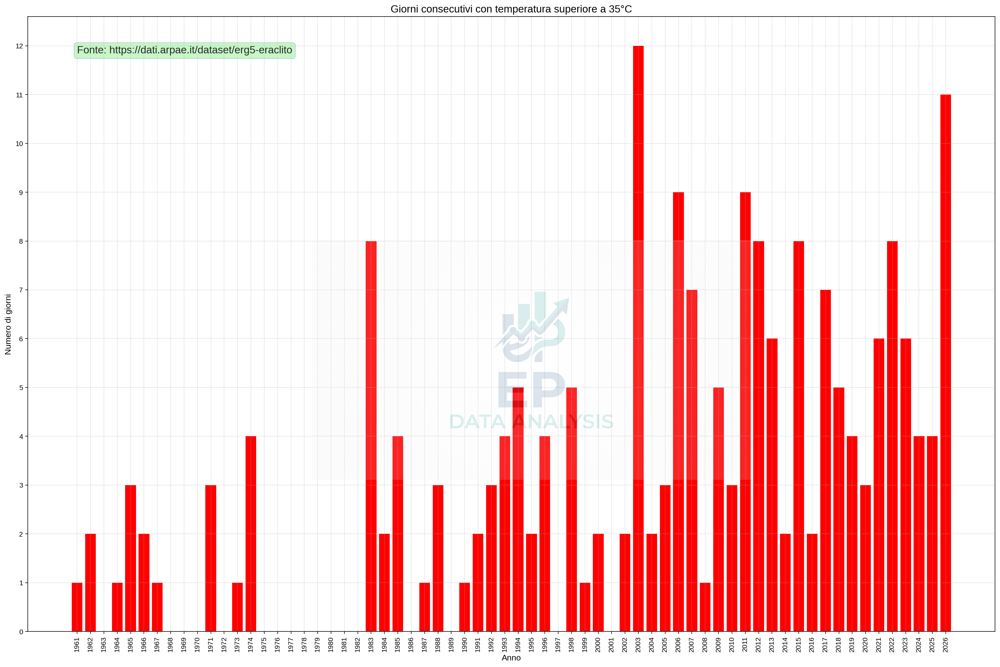

In [5]:

plt.figure(figsize=figsize,dpi=160)
plt.bar(giorni_consecutivi.index, giorni_consecutivi.values, color='red')
plt.style.use(style)
plt.title('Giorni consecutivi con temperatura superiore a 35°C', fontsize=15)
plt.xlabel('Anno', fontsize=12)
plt.ylabel('Numero di giorni', fontsize=12)
plt.yticks(range(0, max(giorni_consecutivi.values)+1, 1))
plt.xticks(rotation=90)
plt.grid(alpha=0.3) 
plt.figimage(wm, xo=1000, yo=600, alpha=0.15, origin='upper')
box = dict(boxstyle='round', facecolor='lightgreen', alpha=0.5, edgecolor='blue')


plt.text(0,12 , "Fonte: https://dati.arpae.it/dataset/erg5-eraclito",  fontsize=15,
        verticalalignment='top', bbox=box)
#plt.savefig('Giorni_caldi.png', dpi=160, bbox_inches='tight')
plt.show()

In [6]:
current_date = dt.date.today()
oggi = current_date.strftime("%m-%d")
maxoggi = datimax.loc[oggi].idxmax() #l'indice (anno) in cui si è registrata la temperatura massima per il giorno corrente
maxcoggi = datimax[maxoggi].loc[oggi] # la temperatura massima registrata per il giorno corrente nell'anno in cui si è registrata la temperatura massima
massima_storica = datimax.max().max() #la temperatura massima mai registrata durante le osservazioni
print(f'La temperatura massima per il giorno {oggi} si è registrata nel {maxoggi}, con {maxcoggi}°C.')
print(f'La temperatura massima mai registrata durante le osservazioni è {massima_storica}°C, registrata il {datimax.max(axis = 1).idxmax()}-{datimax.max().idxmax()}')

La temperatura massima per il giorno 08-07 si è registrata nel 2003, con 39.1°C.
La temperatura massima mai registrata durante le osservazioni è 39.5°C, registrata il 08-03-2017


# Media e mediana temperature massime annuali

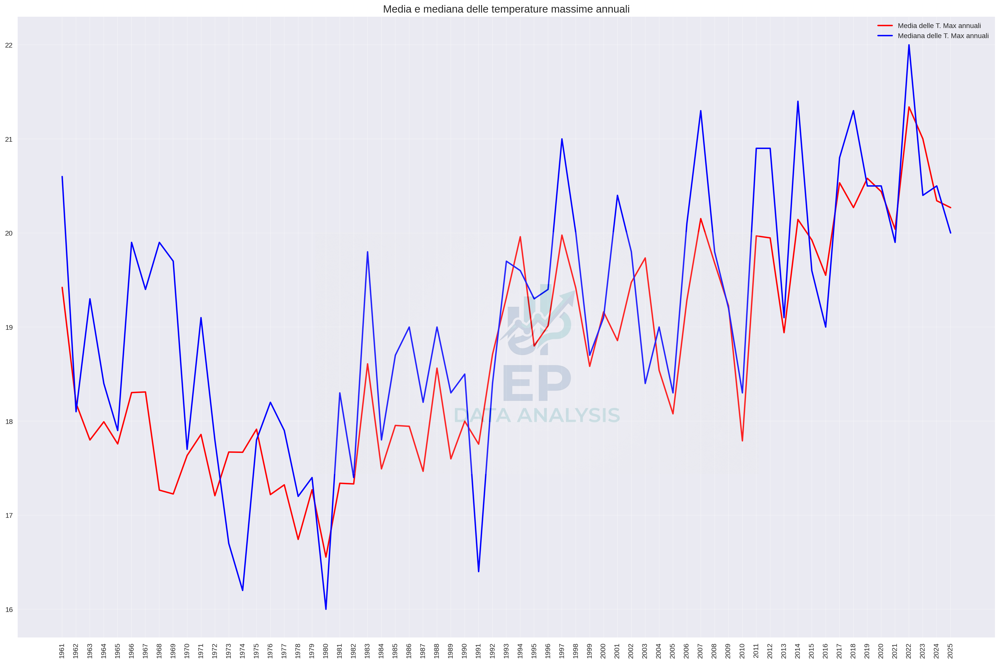

In [7]:
media_annuale = datimax.mean()
mediana_annuale = datimax.median()
plt.figure(figsize =figsize,dpi=160)
plt.style.use(style)
plt.title('Media e mediana delle temperature massime annuali', fontsize=15)
plt.plot(media_annuale[:-1], color='red', linewidth=2, label='Media delle T. Max annuali') #escludo l'ultimo anno perché non è completo!
plt.plot(mediana_annuale[:-1], color='blue', linewidth=2, label='Mediana delle T. Max annuali')
plt.xticks(rotation=90)
plt.grid(alpha=0.3)
plt.figimage(wm, xo=1000, yo=600, alpha=0.15, origin='upper')
#plt.savefig('Media e mediana delle temperature massime annuali.png', dpi=160, bbox_inches='tight')
plt.legend()
plt.show()

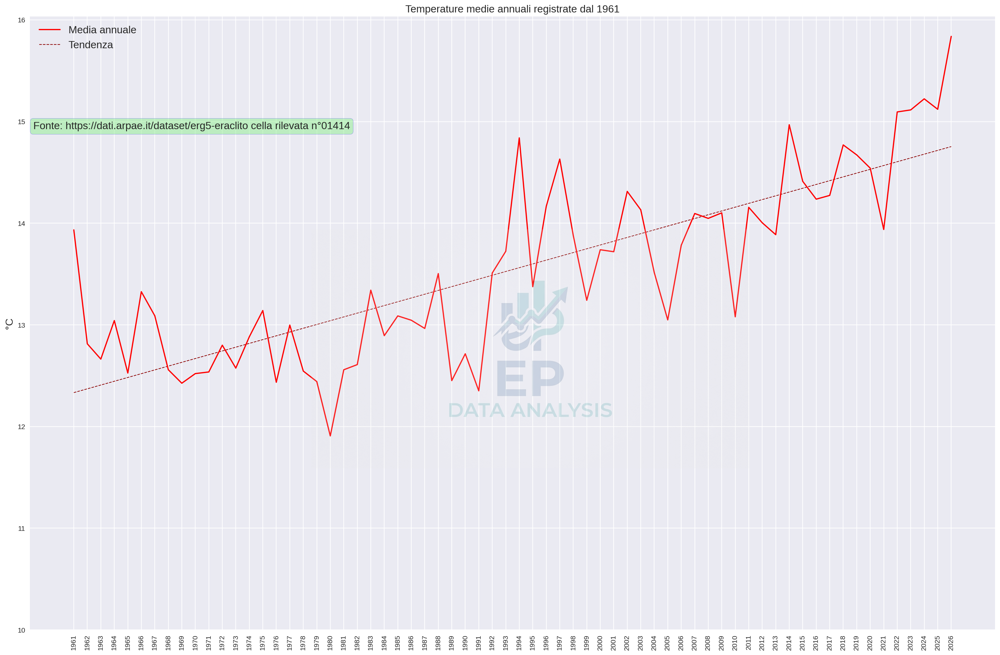

In [8]:
temp_media=(datimax+datimin)/2
plt.figure(figsize=figsize,dpi=160)
plt.style.use(style)

x= temp_media.columns.astype(str)
xnum = np.arange(len(x))
y= temp_media.mean()
m, q = np.polyfit(xnum, y, 1)
linea_tendenza = m * xnum + q
plt.plot(temp_media.mean(), label='Media annuale',color ='red')
plt.plot(x, linea_tendenza, color='darkred', linestyle='--', linewidth=1, label='Tendenza', zorder=1)
plt.title('Temperature medie annuali registrate dal 1961',fontsize = fs)
plt.xticks(rotation=90)
plt.yticks([10,11,12,13,14,15,16])
plt.ylabel('°C', fontsize=fs)
plt.figimage(wm, xo=1000, yo=600, alpha=0.15, origin='upper')
plt.legend(fontsize = fs,loc='upper left') 
#plt.savefig('Tendenzamax.png')
box = dict(boxstyle='round', facecolor='lightgreen', alpha=0.5, edgecolor='blue')


plt.text(-3,15 , "Fonte: https://dati.arpae.it/dataset/erg5-eraclito cella rilevata n°01414",  fontsize=15,
        verticalalignment='top', bbox=box)
plt.show()

#temp_media.mean().plot()

In [9]:
print(datimax.columns) #anni campionati

Index(['1961', '1962', '1963', '1964', '1965', '1966', '1967', '1968', '1969',
       '1970', '1971', '1972', '1973', '1974', '1975', '1976', '1977', '1978',
       '1979', '1980', '1981', '1982', '1983', '1984', '1985', '1986', '1987',
       '1988', '1989', '1990', '1991', '1992', '1993', '1994', '1995', '1996',
       '1997', '1998', '1999', '2000', '2001', '2002', '2003', '2004', '2005',
       '2006', '2007', '2008', '2009', '2010', '2011', '2012', '2013', '2014',
       '2015', '2016', '2017', '2018', '2019', '2020', '2021', '2022', '2023',
       '2024', '2025', '2026'],
      dtype='object')


In [10]:
datimin.info() #umero giorni campionati per anno

<class 'pandas.core.frame.DataFrame'>
Index: 365 entries, 01-01 to 12-31
Data columns (total 66 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   1961    365 non-null    float64
 1   1962    365 non-null    float64
 2   1963    365 non-null    float64
 3   1964    365 non-null    float64
 4   1965    365 non-null    float64
 5   1966    365 non-null    float64
 6   1967    365 non-null    float64
 7   1968    365 non-null    float64
 8   1969    365 non-null    float64
 9   1970    365 non-null    float64
 10  1971    365 non-null    float64
 11  1972    365 non-null    float64
 12  1973    365 non-null    float64
 13  1974    365 non-null    float64
 14  1975    365 non-null    float64
 15  1976    365 non-null    float64
 16  1977    365 non-null    float64
 17  1978    365 non-null    float64
 18  1979    365 non-null    float64
 19  1980    365 non-null    float64
 20  1981    365 non-null    float64
 21  1982    365 non-null    float64
 22  1

In [11]:
datimin.describe()

,1961,1962,1963,1964,1965,1966,1967,1968,1969,1970,...,2017,2018,2019,2020,2021,2022,2023,2024,2025,2026
count,365.000000,365.000000,365.000000,365.000000,365.000000,365.000000,365.000000,365.000000,365.000000,365.000000,...,365.000000,365.000000,365.000000,365.000000,365.000000,365.000000,365.000000,365.000000,365.000000,218.000000
mean,8.446301,7.436438,7.526301,8.090959,7.293699,8.348767,7.867671,7.850137,7.625753,7.406027,...,8.013151,9.269589,8.762192,8.643288,7.835890,8.848767,9.227945,10.103836,9.971507,10.030734
std,7.323728,7.423234,8.795048,7.462444,6.875329,7.496576,7.658519,7.171834,7.229202,7.324434,...,7.578080,7.444139,7.522870,6.817063,7.195393,7.534731,7.321565,7.407339,6.927443,7.499838
min,-7.400000,-7.600000,-15.600000,-12.200000,-6.600000,-13.600000,-11.300000,-14.300000,-7.900000,-11.500000,...,-9.300000,-8.300000,-5.800000,-3.700000,-7.000000,-5.500000,-6.400000,-3.500000,-4.500000,-5.400000
25%,1.300000,0.600000,1.000000,3.400000,1.100000,2.200000,2.000000,1.900000,0.900000,1.000000,...,1.800000,2.300000,1.900000,2.900000,1.400000,2.400000,3.000000,3.600000,4.100000,4.000000
50%,9.800000,8.200000,8.900000,8.600000,7.700000,9.900000,8.300000,9.200000,8.000000,6.300000,...,8.400000,10.200000,8.900000,8.400000,7.900000,8.800000,9.000000,10.600000,9.900000,8.850000
75%,14.900000,13.500000,14.700000,14.300000,13.100000,15.000000,14.600000,13.700000,13.700000,13.900000,...,13.900000,16.200000,15.200000,14.700000,14.200000,16.100000,15.400000,16.000000,16.100000,17.400000
max,21.300000,20.600000,21.000000,20.900000,21.200000,21.300000,21.100000,21.400000,21.600000,20.900000,...,22.700000,23.200000,23.500000,21.600000,22.100000,22.000000,23.600000,22.900000,23.500000,23.400000


# Notti calde

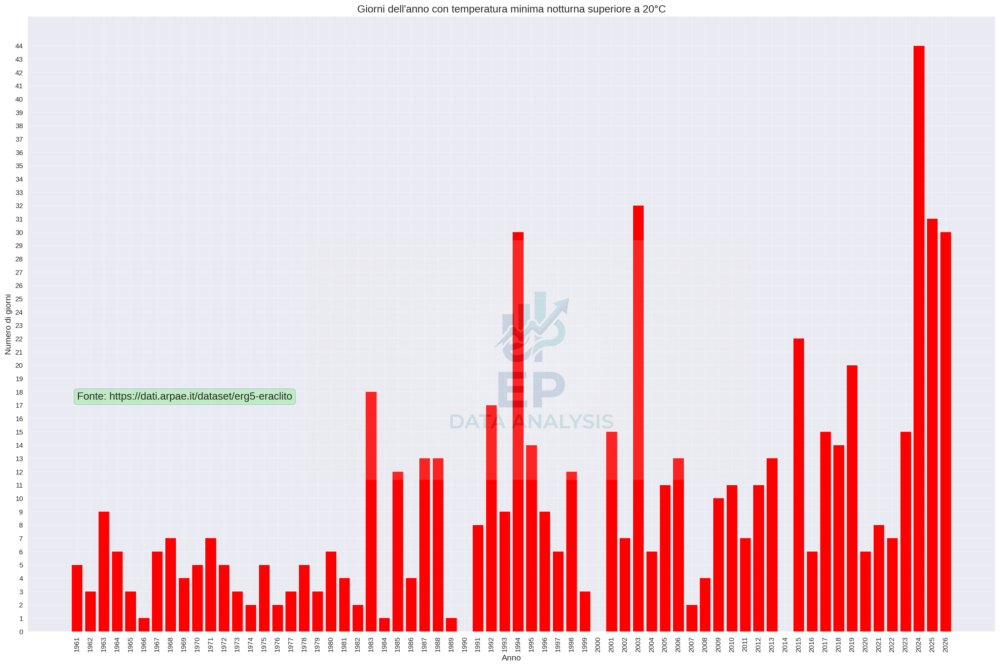

In [12]:
notti_calde = {}
for anno in datimin.columns:
    num_notti_calde = (datimin[anno]>20).sum()
    notti_calde[anno] = num_notti_calde
asse_x = list(notti_calde.keys())
asse_y = list(notti_calde.values())

plt.figure(figsize=figsize,dpi=160)
plt.bar(asse_x, asse_y, color='red')
plt.style.use(style)
plt.title('Giorni dell\'anno con temperatura minima notturna superiore a 20°C', fontsize=15)
plt.xlabel('Anno', fontsize=12)
plt.ylabel('Numero di giorni', fontsize=12)
plt.yticks(range(0, max(asse_y)+1, 1))
plt.xticks(rotation=90)
plt.grid(alpha=0.3) 
plt.figimage(wm, xo=1000, yo=600, alpha=0.15, origin='upper')
box = dict(boxstyle='round', facecolor='lightgreen', alpha=0.5, edgecolor='blue')


plt.text(0,18 , "Fonte: https://dati.arpae.it/dataset/erg5-eraclito",  fontsize=15,
        verticalalignment='top', bbox=box)
#plt.savefig('Giorni_caldi.png', dpi=160, bbox_inches='tight')
plt.show()

## Giorni più caldi di ogni anno

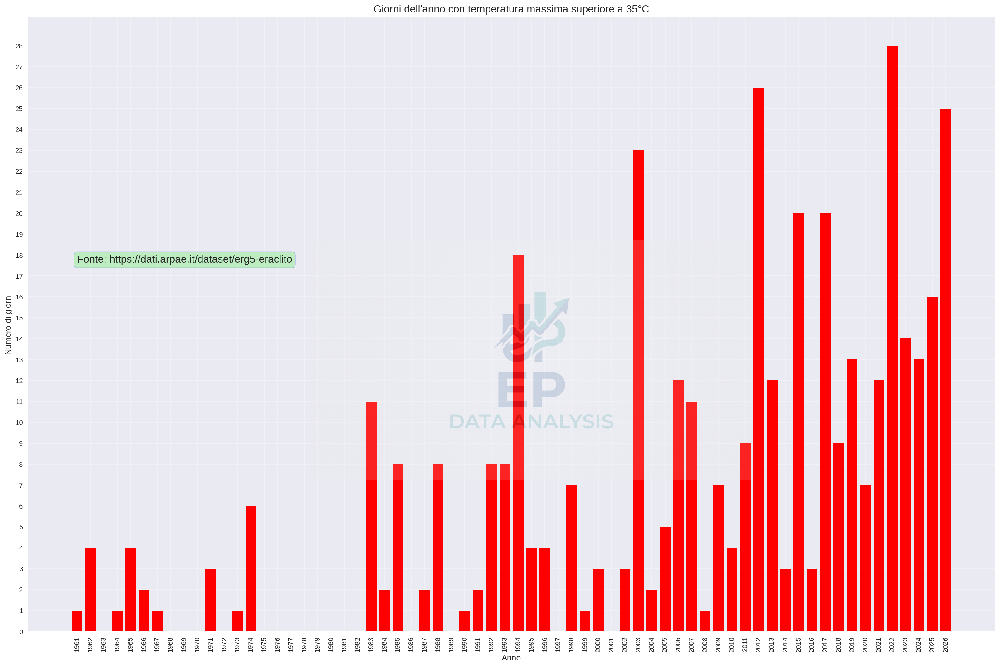

In [13]:
totale_caldi=0
caldi = {}
for anno in datimax.columns[:]: #escludo l'ultimo anno perché non è completo
    giorni_caldi = (datimax[anno] > 35).sum()
    caldi[anno] = giorni_caldi
    totale_caldi+=giorni_caldi
    #print(f"{anno}: {giorni_caldi} giorni di temperatura superiore a 35°C, totale :{totale_caldi}")
y = list(caldi.keys())    
temp = list(caldi.values())
plt.figure(figsize=figsize,dpi=160)
plt.bar(y, temp, color='red')
plt.style.use(style)
plt.title('Giorni dell\'anno con temperatura massima superiore a 35°C', fontsize=15)
plt.xlabel('Anno', fontsize=12)
plt.ylabel('Numero di giorni', fontsize=12)
plt.yticks(range(0, max(temp)+1, 1))
plt.xticks(rotation=90)
plt.grid(alpha=0.3) 
plt.figimage(wm, xo=1000, yo=600, alpha=0.15, origin='upper')
box = dict(boxstyle='round', facecolor='lightgreen', alpha=0.5, edgecolor='blue')


plt.text(0,18, "Fonte: https://dati.arpae.it/dataset/erg5-eraclito",  fontsize=15,
        verticalalignment='top', bbox=box)
#plt.savefig('Giorni_caldi.png', dpi=160, bbox_inches='tight')
plt.show()

## __Temperature oltre i 39° si sono registrate solo dopo il 2003__
## __Ci sono stati più giorni oltre i 37° nel solo 2022 che in 42 anni tra il 1961 e il 2002.__
## __Ci sono stati più giorni oltre i 36° negli ultimi 5 anni che nei 42 anni tra il 1961 e il 2002.__ 
## __Ci sono stati più giorni oltre i 35° nel 2026 che nei 22 anni tra il 1961 e il 1982__

# Andamento T max

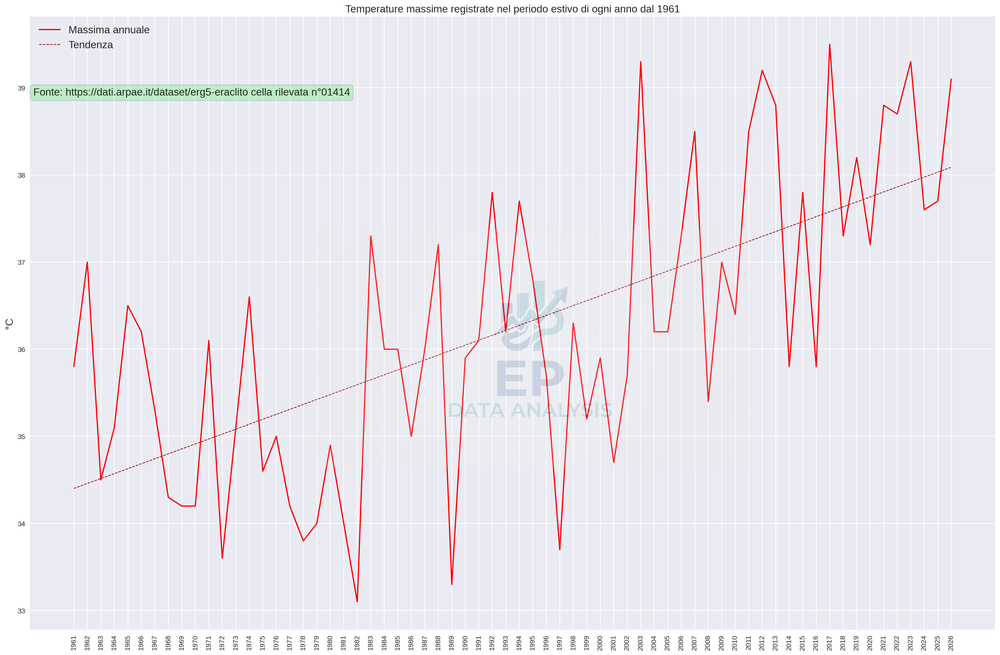

In [14]:
plt.figure(figsize=figsize,dpi=160)
plt.style.use(style)

x= datimax.columns.astype(str)
xnum = np.arange(len(x))
y= datimax.loc['06-01':'09-30'].max()
m, q = np.polyfit(xnum, y, 1)
linea_tendenza = m * xnum + q
plt.plot(x, y, label='Massima annuale',color ='red')
plt.plot(x, linea_tendenza, color='darkred', linestyle='--', linewidth=1, label='Tendenza', zorder=1)
plt.title('Temperature massime registrate nel periodo estivo di ogni anno dal 1961',fontsize = fs)
plt.xticks(rotation=90)
plt.ylabel('°C', fontsize=fs)
plt.figimage(wm, xo=1000, yo=600, alpha=0.15, origin='upper')
plt.legend(fontsize = fs,loc='upper left') 
#plt.savefig('Tendenzamax.png')
box = dict(boxstyle='round', facecolor='lightgreen', alpha=0.5, edgecolor='blue')


plt.text(-3,39 , "Fonte: https://dati.arpae.it/dataset/erg5-eraclito cella rilevata n°01414",  fontsize=15,
        verticalalignment='top', bbox=box)
plt.show()


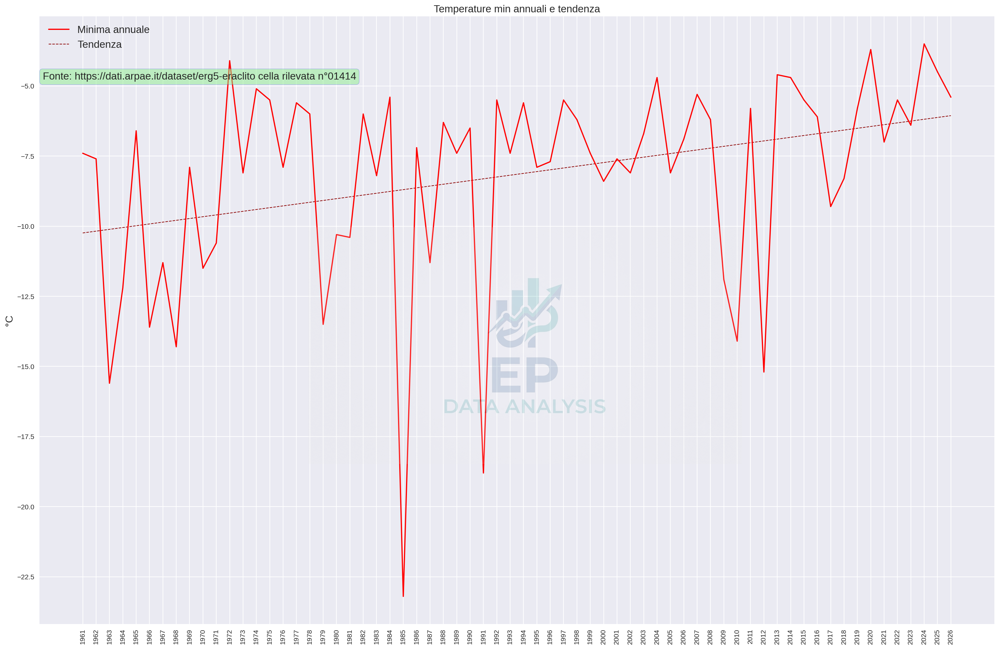

In [15]:
plt.figure(figsize=figsize,dpi=160)
plt.style.use(style)

x= datimin.columns.astype(str)
xnum = np.arange(len(x))
y= datimin.min()
m, q = np.polyfit(xnum, y, 1)
linea_tendenza = m * xnum + q
plt.plot(x, y, label='Minima annuale',color ='red')
plt.plot(x, linea_tendenza, color='darkred', linestyle='--', linewidth=1, label='Tendenza', zorder=1)
plt.title('Temperature min annuali e tendenza',fontsize = fs)
plt.xticks(rotation=90)
plt.ylabel('°C', fontsize=fs)
plt.figimage(wm, xo=1000, yo=600, alpha=0.15, origin='upper')
plt.legend(fontsize = fs,loc='upper left') 
#plt.savefig('Tendenzamax.png')
box = dict(boxstyle='round', facecolor='lightgreen', alpha=0.5, edgecolor='blue')


plt.text(-3,-4.5, "Fonte: https://dati.arpae.it/dataset/erg5-eraclito cella rilevata n°01414",  fontsize=15,
        verticalalignment='top', bbox=box)
plt.show()


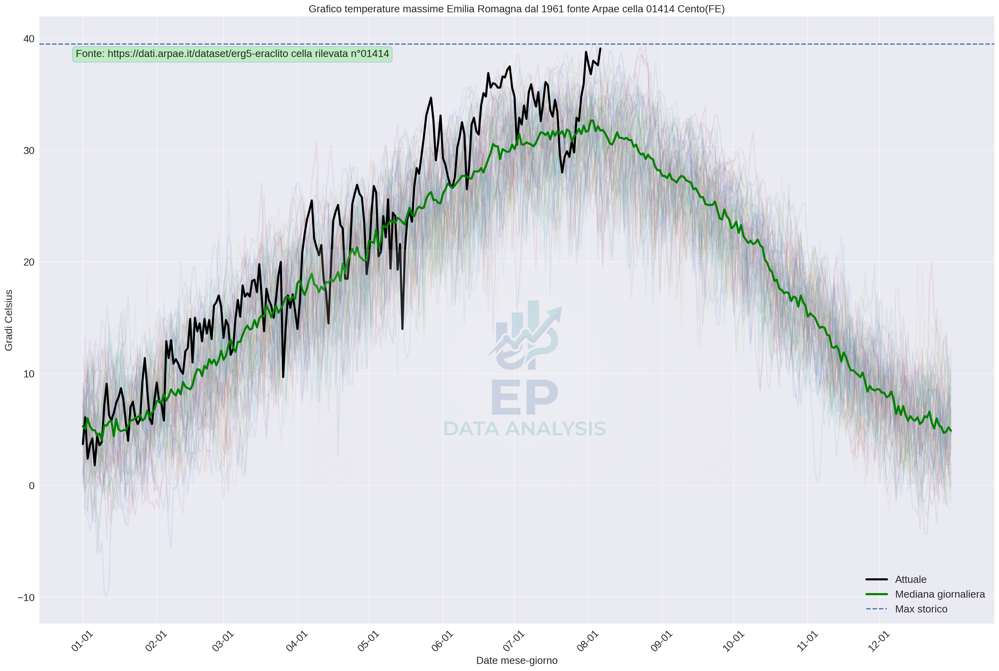

In [16]:

min_giornaliera = datimax.min(axis=1)
max_giornaliera = datimax.max(axis=1)
media_giornaliera = datimax.median(axis=1)

plt.figure(figsize=(25,16),dpi=160)
for column in datimax.columns[:-1]: #escludo l'ultima colonna che è l'attuale e la voglio colorare diversamente per evidenziarla
    plt.plot(datimax.index, datimax[column],alpha=0.1)
plt.plot(datimax.index,datimax['2026'],label = 'Attuale',color='black',linewidth=3, alpha=1)
plt.plot(datimax.index,media_giornaliera,label = 'Mediana giornaliera',color='green',linewidth=3, alpha=1)
#plt.plot(max_giornaliera.index,max_giornaliera,label = '°C Max storico',color='red',linewidth=3, alpha=0.7)
#plt.plot(min_giornaliera.index,min_giornaliera,color = 'green',label = '°C Min storico',linewidth=3,alpha = 0.7)
plt.title('Grafico temperature massime Emilia Romagna dal 1961 fonte Arpae cella 01414 Cento(FE)',fontsize=15)
plt.axhline(max_giornaliera.max(),linestyle = '--',label = 'Max storico')
plt.xlabel('Date mese-giorno')
plt.xticks(['01-01','02-01','03-01','04-01','05-01','06-01','07-01','08-01',
            '09-01','10-01','11-01','12-01'])
plt.ylabel('Gradi Celsius',fontsize=15)
plt.xlabel('Date mese-giorno',fontsize=15)
plt.xticks(rotation=45,fontsize=15)
plt.yticks(fontsize=15)
plt.legend(fontsize=15)
plt.figimage(wm, xo=1000, yo=600, alpha=0.15, origin='upper')
plt.grid(alpha=0.5)

box = dict(boxstyle='round', facecolor='lightgreen', alpha=0.5, edgecolor='blue')


plt.text(-3,39 , "Fonte: https://dati.arpae.it/dataset/erg5-eraclito cella rilevata n°01414",  fontsize=15,
        verticalalignment='top', bbox=box)
#plt.savefig('Temperature massime medie e mediane.png', dpi=160, bbox_inches='tight')
plt.show()

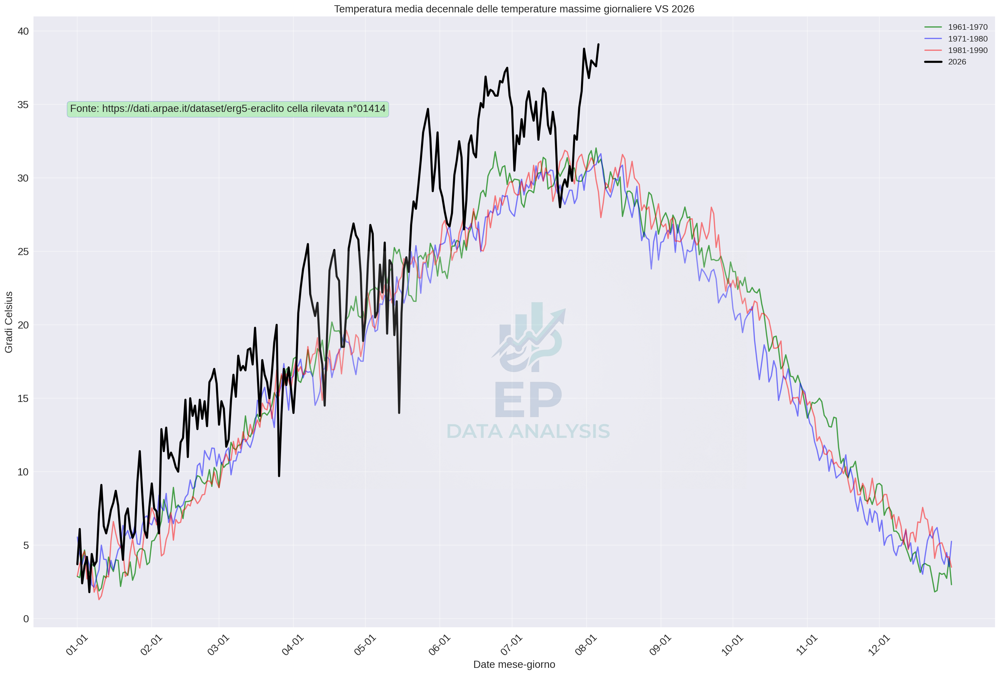

In [17]:
m=datimax[['1961','1962','1963','1964','1965','1966','1967','1968','1969','1970']].mean(axis=1)
m1=datimax[['1971','1972','1973','1974','1975','1976','1977','1978','1979','1980']].mean(axis=1)
m2=datimax[['1981','1982','1983','1984','1985','1986','1987','1988','1989','1990']].mean(axis=1)
m3 =datimax[['1991','1992','1993','1994','1995','1996','1997','1998','1999','2000']].mean(axis=1)
m4=datimax[['2001','2002','2003','2004','2005','2006','2007','2008','2009','2010']].mean(axis=1)
m5=datimax[['2011','2012','2013','2014','2015','2016','2017','2018','2019','2020']].mean(axis=1)
m6=datimax[['2021','2022','2023','2024','2025']].mean(axis=1)
plt.figure(figsize=(25,16),dpi=160)
plt.plot(m,label='1961-1970',color='green',alpha=0.7)
plt.plot(m1,label='1971-1980',color='blue',alpha=0.5)
plt.plot(m2,label='1981-1990',color='red',alpha=0.5)
#plt.plot(m3,label='1991-2000',color='grey',alpha=0.5)
#plt.plot(m4,label='2001-2010',color='orange',alpha=0.5)
#plt.plot(m5,label='2011-2020',color='brown',alpha=0.5)
plt.plot(datimax['2026'],label='2026',color='black',linewidth=3, alpha=1)
plt.legend(fontsize=12,loc='upper right')
plt.title('Temperatura media decennale delle temperature massime giornaliere VS 2026',fontsize=15)
plt.xlabel('Date mese-giorno',fontsize=15)
plt.ylabel('Gradi Celsius',fontsize=15)
plt.xticks(['01-01','02-01','03-01','04-01','05-01','06-01','07-01','08-01',
            '09-01','10-01','11-01','12-01'])
plt.xticks(rotation=45,fontsize=15)
plt.yticks(fontsize=15)
plt.grid(alpha=0.5)
plt.figimage(wm, xo=1000, yo=600, alpha=0.15, origin='upper')
box = dict(boxstyle='round', facecolor='lightgreen', alpha=0.5, edgecolor='blue')


plt.text(-3,35 , "Fonte: https://dati.arpae.it/dataset/erg5-eraclito cella rilevata n°01414",  fontsize=15,
        verticalalignment='top', bbox=box)
#plt.savefig('Temperature massime decennali.png', dpi=300, bbox_inches='tight')
plt.show()  

### Decommentare per effettuare confronto tra il 2026 ed un anno particolare

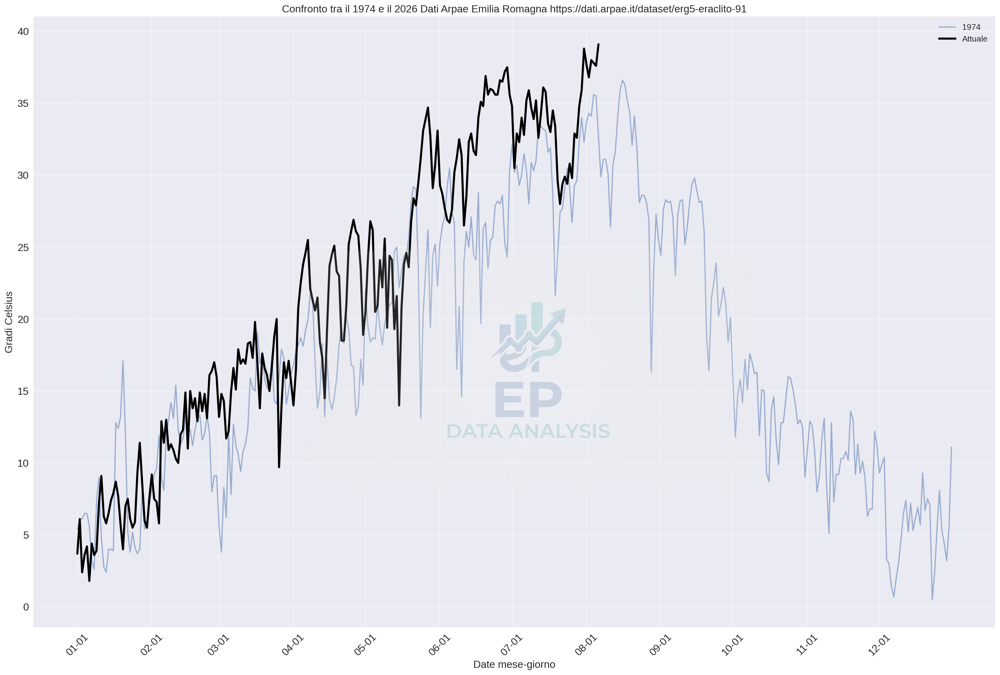

In [26]:
confronto = input('Anno da confrontare con il 2026: ')
plt.figure(figsize=(25,16),dpi=160)
plt.plot(datimax[confronto].index, datimax[confronto], label=confronto, alpha=0.5)
plt.plot(datimax.index,datimax['2026'],label = 'Attuale',color='black',linewidth=3)
plt.title('Confronto tra il ' + str(confronto) + ' e il 2026 Dati Arpae Emilia Romagna https://dati.arpae.it/dataset/erg5-eraclito-91',fontsize=15)
plt.xlabel('Date mese-giorno')
plt.xticks(['01-01','02-01','03-01','04-01','05-01','06-01','07-01','08-01',
            '09-01','10-01','11-01','12-01'])
plt.ylabel('Gradi Celsius',fontsize=15)
plt.xlabel('Date mese-giorno',fontsize=15)
plt.xticks(rotation=45,fontsize=15)
plt.yticks(fontsize=15)
plt.legend(fontsize=12,loc='upper right')
plt.figimage(wm, xo=1000, yo=600, alpha=0.15, origin='upper')
plt.grid(alpha=0.5)
#plt.savefig(f'Confronto tra il {confronto} e 2026.png', dpi=160, bbox_inches='tight')
plt.show()


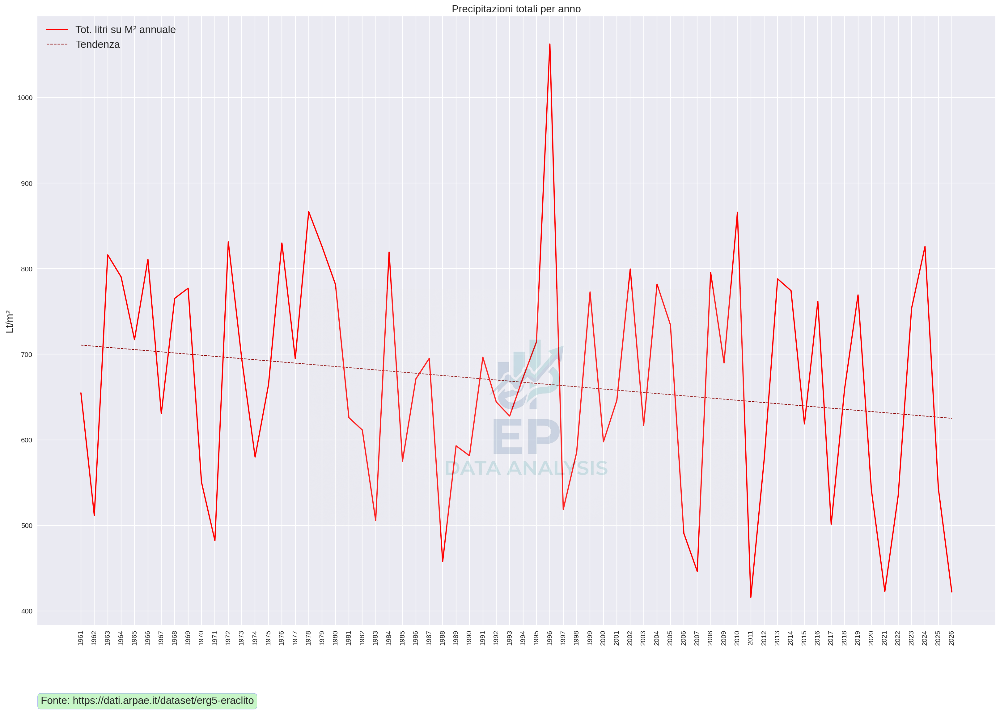

In [19]:
pioggia_media=datiprec.sum(axis=0) # Totale pioggia annuale
pioggia_giornaliera=datiprec.sum(axis=1) #Totale pioggia giornaliera 
giorni_pioggia=(datiprec>0).sum(axis=1)#Totale giorni con pioggia 

plt.figure(figsize=figsize,dpi=160)
plt.style.use(style)

x= datiprec.columns.astype(str)
xnum = np.arange(len(x))
y= datiprec.sum()
m, q = np.polyfit(xnum, y, 1)
linea_tendenza = m * xnum + q
plt.plot(x, y, label='Tot. litri su M² annuale',color ='red')
plt.plot(x, linea_tendenza, color='darkred', linestyle='--', linewidth=1, label='Tendenza', zorder=1)
plt.title('Precipitazioni totali per anno',fontsize = fs)
plt.xticks(rotation=90)
plt.ylabel('Lt/m²', fontsize=fs)
plt.figimage(wm, xo=1000, yo=600, alpha=0.15, origin='upper')
plt.legend(fontsize = fs,loc='upper left') 
#plt.savefig('Tendenzamax.png')
box = dict(boxstyle='round', facecolor='lightgreen', alpha=0.5, edgecolor='blue')


plt.text(-3,300 , "Fonte: https://dati.arpae.it/dataset/erg5-eraclito",  fontsize=15,
        verticalalignment='top', bbox=box)
plt.show()

In [20]:
# datiprec.idxmax()
# for anno in datiprec.columns:
#     print(f'il giorno più piovoso dell\'anno {anno} è stato il {datiprec[anno].idxmax()} con {datiprec[anno].max()} litri su M².')

In [21]:
print(f"Il giorno in media più piovoso è il {pioggia_giornaliera.idxmax()},con {pioggia_giornaliera.max()}  litri su M² totali dal 1961 al 2026.")
print(f"Il giorno in media meno piovoso è il {pioggia_giornaliera.idxmin()},con {pioggia_giornaliera.min()} litri su M² totali dal 1961 al 2026.")
print(f'Il giorno con meno probabilità di pioggia è il {giorni_pioggia.idxmin()}, con {giorni_pioggia.min()/66:.2%} di probabilità.')
print(f'Il giorno con più probabilità di pioggia è il {giorni_pioggia.idxmax()}, con {giorni_pioggia.max()/66:.2%} di probabilità.')

Il giorno in media più piovoso è il 09-17,con 302.7  litri su M² totali dal 1961 al 2026.
Il giorno in media meno piovoso è il 08-03,con 28.5 litri su M² totali dal 1961 al 2026.
Il giorno con meno probabilità di pioggia è il 07-01, con 12.12% di probabilità.
Il giorno con più probabilità di pioggia è il 11-05, con 57.58% di probabilità.


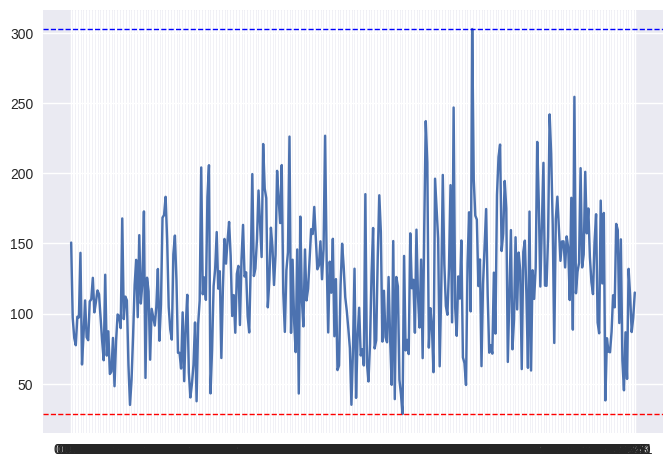

In [22]:
plt.plot(pioggia_giornaliera)
plt.axhline(pioggia_giornaliera.min(), color='red', linestyle='--', linewidth=1, label='Minimo')
plt.axhline(pioggia_giornaliera.max(), color='blue', linestyle='--', linewidth=1, label='Massimo')
plt.show()